#**LASKAR LIMA MUDA**

- Ahmad Syaifudin

- Faaza Naima

- Izham Fathulhaq

- Kakha Rian Ghifari

- Robertus Danu Priyambodo

https://colab.research.google.com/drive/1OIKPgm739YXOryXfbM1hzMQKLQSeKyHO?usp=sharing

#**BUSINESS UNDERSTANDING**

Dalam proyek ini, kita dihadapkan pada dataset "Cyberbullying Tweet" dari
Kaggle, yang berisi dua fitur utama: "tweet_text" dan "cyberbullying_type" dengan tipe data objek. Fokus utama proyek ini adalah membangun model analisis sentimen untuk mengklasifikasikan tweet sebagai cyberbullying atau tidak. Melalui tahap analisis sentimen, tujuan kami adalah menentukan apakah setiap tweet bersifat positif, negatif, atau netral, dengan penekanan khusus pada identifikasi cyberbullying.

Setelah berhasil mengembangkan model analisis sentimen, langkah selanjutnya adalah mendeploynya menggunakan platform hosting gratis seperti Streamlit. Hal ini bertujuan agar model dapat diakses oleh berbagai orang melalui antarmuka pengguna yang sederhana. Dengan memberikan akses mudah, kami berharap dapat melibatkan lebih banyak orang dalam upaya untuk mengidentifikasi dan mengatasi cyberbullying secara online, sehingga menciptakan lingkungan digital yang lebih aman.

Proyek ini memiliki dampak positif dalam meningkatkan kesadaran terhadap cyberbullying dan memberikan alat bagi masyarakat untuk menghadapi perilaku negatif online. Dengan menyediakan antarmuka pengguna yang user-friendly melalui Streamlit, proyek ini berpotensi membantu menciptakan komunitas online yang lebih positif dan peduli terhadap kesejahteraan bersama.

#**DATA UNDERSTANDING**

### **INSTALL & IMPORTING LIBRARIES**

In [1]:
pip install contractions

In [2]:
pip install autocorrect

  Using cached autocorrect-2.6.1-py3-none-any.whl
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install --upgrade emoji

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install nltk

  Using cached nltk-3.8.1-py3-none-any.whl.metadata (2.8 kB)
  Using cached joblib-1.3.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached regex-2023.12.25-cp39-cp39-win_amd64.whl.metadata (41 kB)
  Using cached tqdm-4.66.2-py3-none-any.whl.metadata (57 kB)
Using cached nltk-3.8.1-py3-none-any.whl (1.5 MB)
Using cached regex-2023.12.25-cp39-cp39-win_amd64.whl (269 kB)
Using cached joblib-1.3.2-py3-none-any.whl (302 kB)
Using cached tqdm-4.66.2-py3-none-any.whl (78 kB)
Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


In [12]:
pip install scikit-learn

  Using cached scikit_learn-1.4.1.post1-cp39-cp39-win_amd64.whl.metadata (11 kB)
  Using cached scipy-1.12.0-cp39-cp39-win_amd64.whl.metadata (60 kB)
  Using cached threadpoolctl-3.3.0-py3-none-any.whl.metadata (13 kB)
Using cached scikit_learn-1.4.1.post1-cp39-cp39-win_amd64.whl (10.6 MB)
Using cached scipy-1.12.0-cp39-cp39-win_amd64.whl (46.2 MB)
Using cached threadpoolctl-3.3.0-py3-none-any.whl (17 kB)
Note: you may need to restart the kernel to use updated packages.


In [13]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter #VSL
import plotly.express as px #VSL
import pandas as pd
import string  # For some string manipulation tasks
import nltk  # Natural Language Toolkit
import re  # Regular expression
from string import punctuation  # Solving punctuation problems
from nltk.corpus import stopwords  # Stop words in sentences
from nltk.stem import WordNetLemmatizer  # For stemming the sentence
from nltk.stem import SnowballStemmer  # For stemming the sentence
from contractions import contractions_dict  # To solve contractions
from autocorrect import Speller  # Correcting spellings
import seaborn as sns

nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

# Text cleaning
import re
import string
import emoji
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords

#Libraries for general purpose
import matplotlib.pyplot as plt
import seaborn as sns


#Data preprocessing
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

# Random Forest
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.ensemble import RandomForestClassifier

# evaluate model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\rokeu\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rokeu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rokeu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### **BASIC EDA**

In [14]:
df=pd.read_csv('https://raw.githubusercontent.com/faazanaima/cyberbullying-tweets/main/cyberbullying_tweets.csv')
df.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


In [16]:
df.describe()

,tweet_text,cyberbullying_type
count,47692,47692
unique,46017,6
top,RT @sailorhg: the intro for my hardware hackin...,religion
freq,2,7998


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [18]:
df['cyberbullying_type'].value_counts()

cyberbullying_type
religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: count, dtype: int64

#**DATA PREPARATION**

In [20]:
df = df.rename(columns={'tweet_text': 'text', 'cyberbullying_type': 'sentiment'})

In [21]:
df["sentiment"].unique()

array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

In [22]:
df.isnull().sum()

text         0
sentiment    0
dtype: int64

In [23]:
# Checking duplicated
df.duplicated().sum()

36

In [24]:
# Dropping any duplicated comment
df = df.drop_duplicates(subset='text', keep='first')
df.duplicated().sum()

0

In [25]:
df.drop(df[df['sentiment'] == 'other_cyberbullying'].index, inplace = True)
df['sentiment'].value_counts()

sentiment
religion             7995
age                  7992
ethnicity            7952
not_cyberbullying    7937
gender               7898
Name: count, dtype: int64

In [26]:
#Clean emojis from text
def strip_emoji(text):
    emoji_pattern = re.compile("["
                            u"\U0001F600-\U0001F64F"  # emoticons
                            u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                            u"\U0001F680-\U0001F6FF"  # transport & map symbols
                            u"\U0001F700-\U0001F77F"  # alchemical symbols
                            u"\U0001F780-\U0001F7FF"  # Geometric Shapes Extended
                            u"\U0001F800-\U0001F8FF"  # Supplemental Arrows-C
                            u"\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
                            u"\U0001FA00-\U0001FA6F"  # Chess Symbols
                            u"\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
                            u"\U00002702-\U000027B0"  # Dingbats
                            u"\U000024C2-\U0001F251"
                            "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [27]:
def text_cleaning(text):
    # Remove \n and \r, convert to lowercase
    text = text.replace('\r', '').replace('\n', ' ').lower()

    # Remove mentions and links
    text = re.sub(r'(@\S+|https?:\S+|http?:\S+)', ' ', text)

    # Remove non-UTF-8/ASCII characters
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)

    # Remove punctuation
    banned_list = string.punctuation
    table = str.maketrans('', '', banned_list)
    text = text.translate(table)

    # Define stop words (assuming you want to use NLTK's English stop words)
    stop_words = set(stopwords.words('english'))

    # Remove stopwords
    text = ' '.join(word for word in text.split() if word.lower() not in stop_words)

    # Remove words longer than 14 characters
    text = ' '.join(word for word in text.split() if len(word) < 14)

    return text

In [28]:
from wordcloud import STOPWORDS
STOPWORDS.update(['rt', 'mkr', 'didn', 'bc', 'n', 'm',
                  'im', 'll', 'y', 've', 'u', 'ur', 'don',
                  'p', 't', 's', 'aren', 'kp', 'o', 'kat',
                  'de', 're', 'amp', 'will'])
def remove_stopwords(text):
    return " ".join([word for word in
                     str(text).split() if word not in STOPWORDS])

In [29]:
#clean hashtags at the end of the sentence, and keep those in the middle of the sentence by removing just the "#" symbol
def clean_hashtags(tweet):
    new_tweet = " ".join(word.strip() for word in re.split('#(?!(?:hashtag)\b)[\w-]+(?=(?:\s+#[\w-]+)*\s*$)', tweet)) #remove last hashtags
    new_tweet2 = " ".join(word.strip() for word in re.split('#|_', new_tweet)) #remove hashtags symbol from words in the middle of the sentence
    return new_tweet2

In [30]:
#Filter special characters such as "&" and "$" present in some words
def filter_chars(a):
    sent = []
    for word in a.split(' '):
        if ('$' in word) | ('&' in word):
            sent.append('')
        else:
            sent.append(word)
    return ' '.join(sent)

In [31]:
#Remove multiple sequential spaces
def remove_mult_spaces(text):
    return re.sub("\s\s+" , " ", text)

In [32]:
#Stemming
def stemmer(text):
    tokenized = nltk.word_tokenize(text)
    ps = PorterStemmer()
    return ' '.join([ps.stem(words) for words in tokenized])

In [33]:
#Lemmatization
def lemmatize(text):
    tokenized = nltk.word_tokenize(text)
    lm = WordNetLemmatizer()
    return ' '.join([lm.lemmatize(words) for words in tokenized])

In [37]:
# Initialize spell checker
spell = Speller()

def preprocess_text(text):
    # Your text cleaning and preprocessing steps here
    # For example, removing stop words and applying spell checker
    stop_words = set(stopwords.words('english'))
    words = [spell(word) for word in text.split() if word.lower() not in stop_words]

    # Additional preprocessing steps can be added

    # Join the words back into a sentence
    cleaned_text = ' '.join(words)

    return cleaned_text

In [38]:
#Then we apply all the defined functions in the following order
def preprocess(text):
    text = strip_emoji(text)
    text = remove_stopwords(text)
    text = text_cleaning(text)
    text = clean_hashtags(text)
    text = filter_chars(text)
    text = remove_mult_spaces(text)
    text = stemmer(text)
    text = lemmatize(text)
    text = preprocess_text(text)
    return text

# import pickle
# with open('preprocess.pkl', 'wb') as r:
#     pickle.dump(preprocess, r)


In [39]:
texts_cleaned = []
for i in df.text:
    texts_cleaned.append(preprocess(i))

In [40]:
df['text_clean'] = texts_cleaned

In [41]:
df.head()

,text,sentiment,text_clean
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandr food crapilici mr
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussie white mr hemlock today sunrise studio10...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,class whore red velvet cupcak
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh p thank head concern not angry dude twitter
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretend kurdish account like islam...


In [42]:
# Phrase length of every tweet
df['length'] = [len(i) for i in df.text_clean]
pd.set_option('display.max_rows', None)
df

,text,sentiment,text_clean,length
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandr food crapilici mr,33
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussie white mr hemlock today sunrise studio10...,74
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,class whore red velvet cupcak,29
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh p thank head concern not angry dude twitter,47
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretend kurdish account like islam...,50
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,ye test god good bad differ weird white prove ...,55
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,itu sekolah ya sukan template bull ga math kay...,54
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,karma hope bite kat butt nasty mr,33
8,@stockputout everything but mostly my priest,not_cyberbullying,every mostly priest,19
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,rebecca black drop school due bull,34


In [43]:
df.columns

Index(['text', 'sentiment', 'text_clean', 'length'], dtype='object')

In [44]:
# Menghitung mean dan deviasi standar dari kolom 'length'
mean_length = df['length'].mean()
std_dev_length = df['length'].std()

# Mencetak hasil
print("Mean (Rata-rata) dari 'length':", mean_length)
print("Deviasi Standar dari 'length':", std_dev_length)

Mean (Rata-rata) dari 'length': 77.47842811887162
Deviasi Standar dari 'length': 46.421173792716786


In [45]:
# handling outlier
# Calculate Q1 and Q3
q1 = np.percentile(df['length'], 25)
q3 = np.percentile(df['length'], 75)

# Calculate IQR
iqr = q3 - q1

# Determine lower and upper bounds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Create a cleaned DataFrame without outliers
df_cleaned = df[(df['length'] >= lower_bound) & (df['length'] <= upper_bound)]

print("DataFrame Without Outliers:")
df_cleaned.head()

DataFrame Without Outliers:


,text,sentiment,text_clean,length
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandr food crapilici mr,33
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussie white mr hemlock today sunrise studio10...,74
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,class whore red velvet cupcak,29
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh p thank head concern not angry dude twitter,47
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretend kurdish account like islam...,50


In [46]:
df['sentiment'].unique()

array(['not_cyberbullying', 'gender', 'religion', 'age', 'ethnicity'],
      dtype=object)

In [47]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline


tfidf = TfidfTransformer()
clf = CountVectorizer()

X_cv =  clf.fit_transform(df['text_clean'])

tf_transformer = TfidfTransformer(use_idf=True).fit(X_cv)
X_tf = tf_transformer.transform(X_cv)

In [ ]:
# # Save the fitted CountVectorizer
# with open('count_vectorizer.pkl', 'wb') as file:
#     pickle.dump(clf, file)

# # Save the fitted TfidfTransformer
# with open('tfidf_transformer.pkl', 'wb') as file:
#     pickle.dump(tf_transformer, file)

In [48]:
X_tf

<39774x21487 sparse matrix of type '<class 'numpy.float64'>'
	with 492717 stored elements in Compressed Sparse Row format>

In [68]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Tokenize the sentences into words and store them in a list
tokenized_sentences = [word_tokenize(sentence.lower()) for sentence in df.text_clean]

# Create Word2Vec model using the list
model = Word2Vec(sentences=tokenized_sentences, vector_size=100, window=5, min_count=5, workers=4, epochs=6)

# Save the model (optional)
model.save("word2vec.model")

# Retrieve the word embeddings
word_embeddings = {word: model.wv[word] for word in model.wv.index_to_key}

# Example: Get the embedding for the word "clean"
embedding_for_clean = word_embeddings.get('clean', None)
if embedding_for_clean is not None:
    print("Embedding for 'clean':", embedding_for_clean)
else:
    print("Word 'clean' not found in the vocabulary.")

Embedding for 'clean': [-0.30068162  0.14232033  0.15935183  0.10338935 -0.04856659 -0.16329448
 -0.03506935  0.5016629  -0.03274317 -0.05648911 -0.11934201 -0.35949695
 -0.21128775 -0.06058884 -0.35351703 -0.3407919  -0.04157229 -0.2738282
 -0.11051322 -0.20506395  0.02067321  0.1395889  -0.13597244 -0.3431099
 -0.16576204 -0.00798016 -0.12911057 -0.53598183 -0.14729837  0.0611003
  0.05784484 -0.03740617 -0.03002805 -0.27500078 -0.13300835  0.23597708
  0.02400029 -0.09808132  0.15802516 -0.6857775   0.02649113 -0.17877072
  0.15621422 -0.35457468 -0.02046542 -0.32526132 -0.3389693  -0.02872151
  0.12369509  0.16076949  0.05795181 -0.02183022 -0.34640536 -0.07585232
 -0.13597183 -0.04054886  0.25859785 -0.10083982 -0.68835247  0.14664938
 -0.0101327   0.17311257 -0.465452    0.16085804  0.03327235  0.12390373
  0.2638173   0.01519852 -0.1899934   0.00421182 -0.17415448 -0.19493426
  0.05526504 -0.37757012  0.21373557 -0.07348582 -0.30538994 -0.14768392
  0.08106621  0.27444518  0.107

#**DATA VISUALIZATION**

###**GROUPING**

In [69]:
dfv = df.copy()

In [70]:
dfv.head()

,text,sentiment,text_clean,length
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandr food crapilici mr,33
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussie white mr hemlock today sunrise studio10...,74
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,class whore red velvet cupcak,29
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh p thank head concern not angry dude twitter,47
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretend kurdish account like islam...,50


In [71]:
dfv['sentiment'].unique()

array(['not_cyberbullying', 'gender', 'religion', 'age', 'ethnicity'],
      dtype=object)

In [72]:
# dfv_vc=dfv['sentiment'].value_counts()
# dfv_vc

sentiment
religion             7995
age                  7992
ethnicity            7952
not_cyberbullying    7937
gender               7898
Name: count, dtype: int64

In [73]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('value_counts.pkl', 'wb') as file:
#     pickle.dump(dfv_vc, file)

### **Top 10 Bullying Words**

In [74]:
#Menghitung dan menampilkan 10 kata bullying umum secara visual.
dfv['tweet_list'] = dfv['text_clean'].apply(lambda x:str(x).split())
top = Counter([item for sublist in dfv['tweet_list'] for item in sublist])
tweet_list1 = pd.DataFrame(top.most_common(10))
tweet_list1.columns = ['Words','Count']
tweet_list1.style.background_gradient(cmap='Blues')

,Words,Count
0,bull,10394
1,school,9171
2,fuck,7417
3,bigger,5757
4,joke,5543
5,girl,5530
6,dumb,5336
7,high,5097
8,muslim,4827
9,people,4477


In [75]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('tweet_list1.pkl', 'wb') as file:
#     pickle.dump(tweet_list1, file)

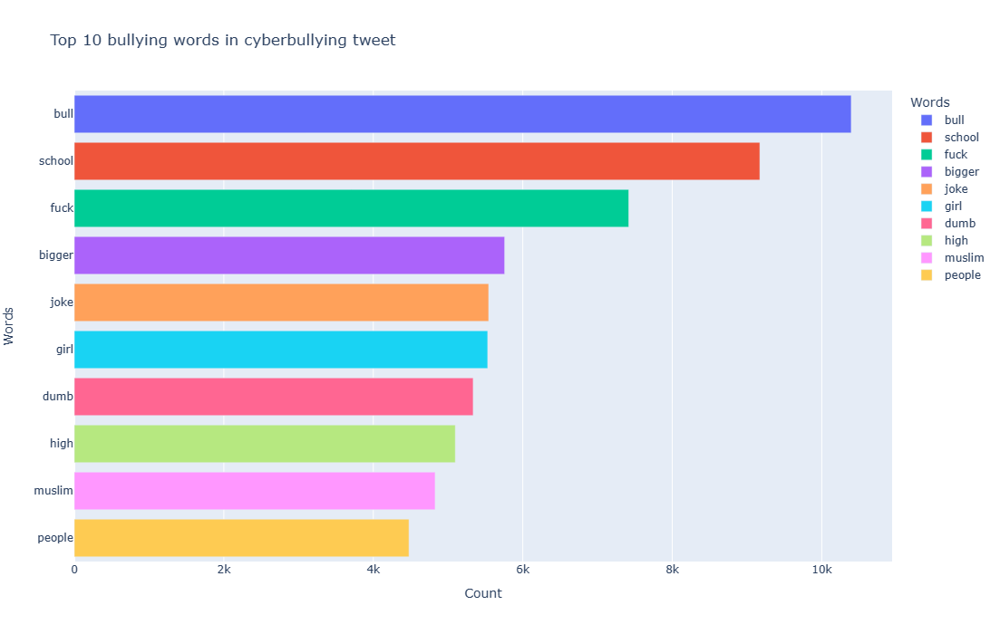

In [78]:
figure = px.bar(tweet_list1, x="Count", y="Words", title='Top 10 bullying words in cyberbullying tweet', orientation='h',
             width=700, height=700,color='Words')
figure.show()

### **Top 10 Gender Cyberbullying Words**

In [79]:
gender_type = dfv[dfv['sentiment']=='gender']
religion_type = dfv[dfv['sentiment']=='religion']
age_type = dfv[dfv['sentiment']=='age']
ethnicity_type = dfv[dfv['sentiment']=='ethnicity']

In [81]:
#Top 10 Words in Gender cyberbullying Tweet
top10_gender = Counter([item for sublist in gender_type['tweet_list'] for item in sublist])
type_g = pd.DataFrame(top10_gender.most_common(10))
type_g.columns = ['Top of Words','Count']
type_g.style.background_gradient(cmap='Blues')

,Top of Words,Count
0,joke,5351
1,rape,4221
2,gay,4031
3,call,1406
4,make,1349
5,rt,1238
6,woman,1189
7,bitch,1178
8,female,1113
9,people,998


In [82]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('tweet_list2.pkl', 'wb') as file:
#     pickle.dump(type_g, file)

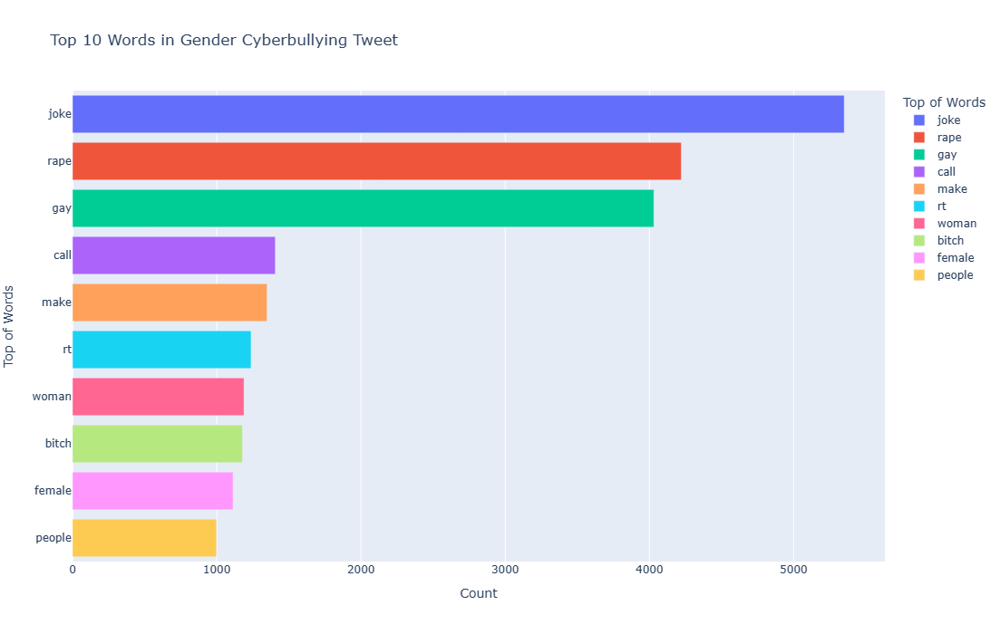

In [83]:
g_fig = px.bar(type_g, x="Count", y="Top of Words", title='Top 10 Words in Gender Cyberbullying Tweet', orientation='h',
             width=700, height=700,color='Top of Words')
g_fig.show()

###**Top 10 Age Cyberbullying Words**

In [85]:
#Top 10 Words in Age Cyberbullying Tweet
top10_a = Counter([item for sublist in age_type['tweet_list'] for item in sublist])
type_a = pd.DataFrame(top10_a.most_common(10))
type_a.columns = ['Top of Words','Count']
type_a.style.background_gradient(cmap='Blues')

,Top of Words,Count
0,bull,9038
1,school,8565
2,high,4951
3,girl,4704
4,one,1051
5,people,935
6,got,848
7,kid,809
8,middle,717
9,friend,634


In [86]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('tweet_list3.pkl', 'wb') as file:
#     pickle.dump(type_a, file)

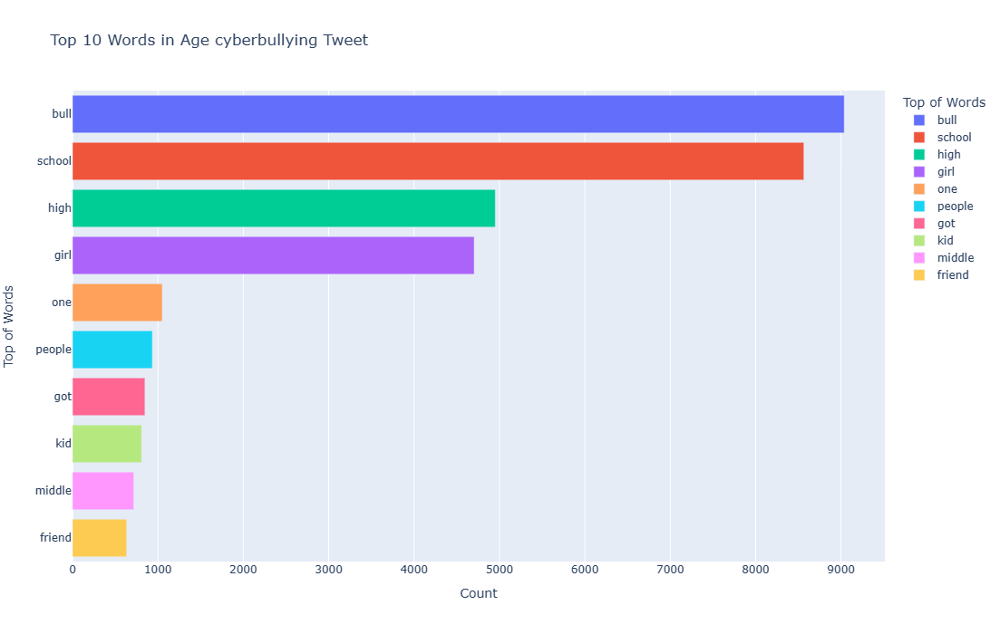

In [87]:
a_fig = px.bar(type_a, x="Count", y="Top of Words", title='Top 10 Words in Age cyberbullying Tweet', orientation='h',
             width=700, height=700,color='Top of Words')
a_fig.show()

###**Top 10 Ethnicity Cyberbullying Words**

In [88]:
#Top 10 Words in Ethnicity Cyberbullying Tweet
top10_e = Counter([item for sublist in ethnicity_type['tweet_list'] for item in sublist])
type_e = pd.DataFrame(top10_e.most_common(10))
type_e.columns = ['Top of Words','Count']
type_e.style.background_gradient(cmap='Blues')

,Top of Words,Count
0,fuck,6084
1,bigger,5693
2,dumb,5170
3,black,2161
4,white,1619
5,call,1388
6,people,1190
7,rt,1180
8,obama,1147
9,one,1073


In [89]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('tweet_list4.pkl', 'wb') as file:
#     pickle.dump(type_e, file)

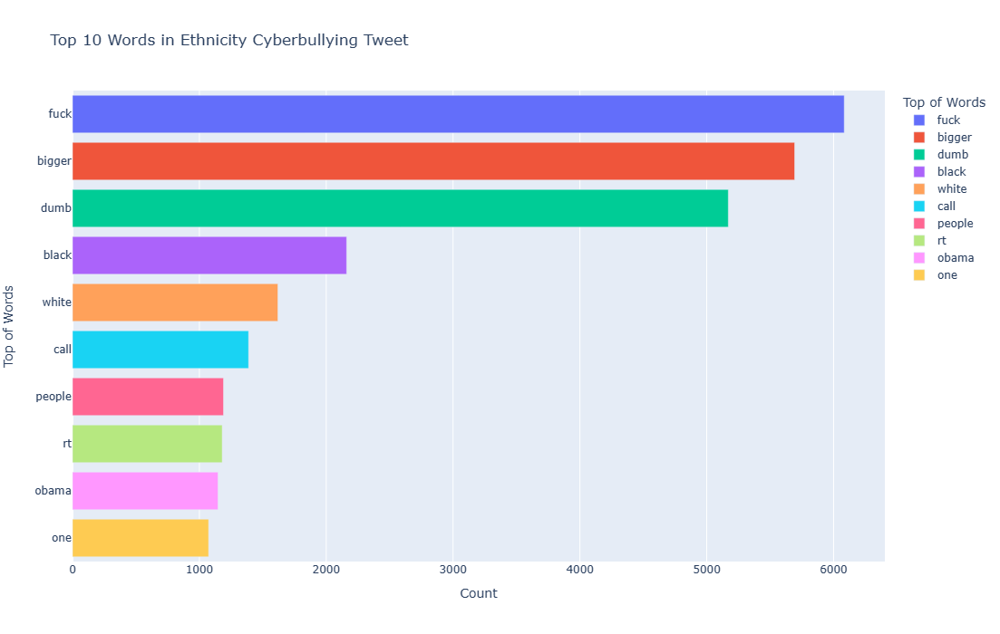

In [90]:
e_fig = px.bar(type_e, x="Count", y="Top of Words", title='Top 10 Words in Ethnicity Cyberbullying Tweet', orientation='h',
             width=700, height=700,color='Top of Words')
e_fig.show()

###**Top 10 Religion Cyberbullying Words**

In [91]:
#Top 10 Words in Religion Cyberbullying Tweet
top10_r = Counter([item for sublist in religion_type['tweet_list'] for item in sublist])
type_r = pd.DataFrame(top10_r.most_common(10))
type_r.columns = ['Top of Words','Count']
type_r.style.background_gradient(cmap='Blues')

,Top of Words,Count
0,muslim,4696
1,idiot,3097
2,islam,2486
3,christian,2165
4,terrorist,1407
5,right,1388
6,woman,1269
7,support,1264
8,terror,1193
9,radio,1113


In [92]:
# # Save DataFrame to a pickle file for Top 10 Bullying Words
# with open('tweet_list5.pkl', 'wb') as file:
#     pickle.dump(type_r, file)

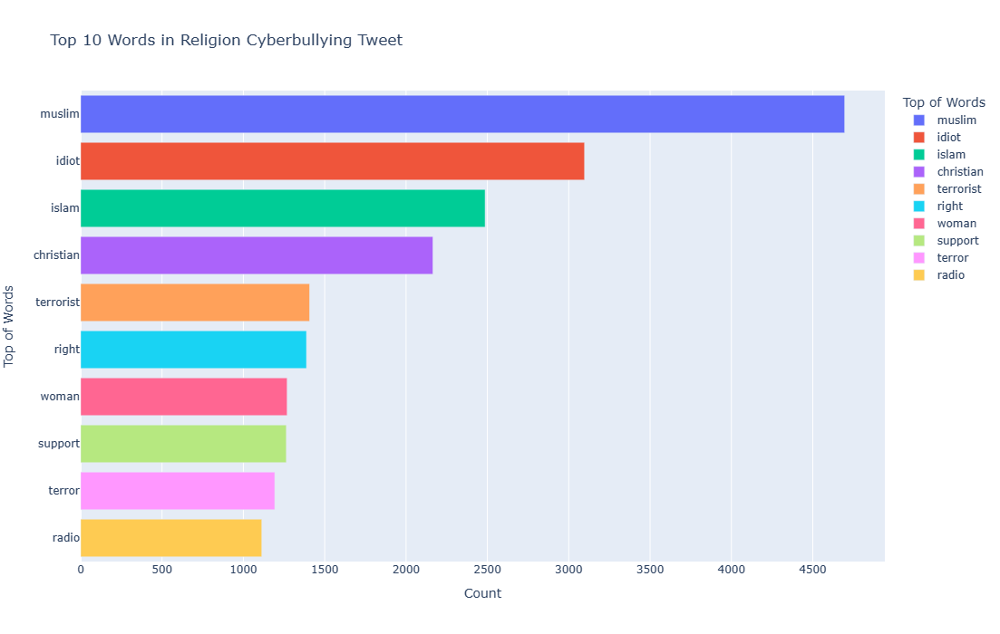

In [93]:
r_fig = px.bar(type_r, x="Count", y="Top of Words", title='Top 10 Words in Religion Cyberbullying Tweet', orientation='h',
             width=700, height=700,color='Top of Words')
r_fig.show()

# **DATA MODELLING**

In [94]:
from sklearn.model_selection import train_test_split
# train and test
X_train, X_test, y_train, y_test = train_test_split(X_tf, df['sentiment'], test_size=0.20, stratify=df['sentiment'], random_state=42)

In [51]:
y_train.value_counts()

sentiment
religion             6396
age                  6393
ethnicity            6362
not_cyberbullying    6350
gender               6318
Name: count, dtype: int64

#**EVALUATION**

In [52]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)


In [53]:
print("LabelEncoder classes:", label_encoder.classes_)

LabelEncoder classes: ['age' 'ethnicity' 'gender' 'not_cyberbullying' 'religion']


In [54]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train, y_train)

RandomForestClassifier()

In [55]:
from sklearn.metrics import classification_report

rf_pred = rf_clf.predict(X_test)
print('Classification Report for Random Forest:\n', classification_report(y_test, rf_pred))

Classification Report for Random Forest:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1599
           1       0.99      0.97      0.98      1590
           2       0.93      0.86      0.89      1580
           3       0.81      0.89      0.85      1587
           4       0.96      0.96      0.96      1599

    accuracy                           0.93      7955
   macro avg       0.93      0.93      0.93      7955
weighted avg       0.93      0.93      0.93      7955



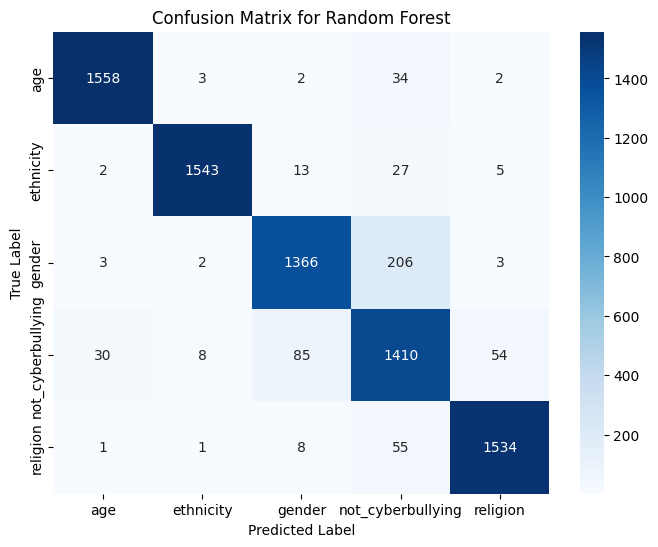

In [56]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, rf_pred)

# Display the confusion matrix with heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


#**MODEL DEPLOYMENT**

## Predict

### Prediction Model 1

In [58]:
#
filtered_df = df[df['sentiment'] == 'age']
row_df = filtered_df.iloc[[2]]  # Menggunakan [[5]] untuk mendapatkan hasil dalam bentuk DataFrame
row_df

,text,sentiment,text_clean,length
31741,There was a girl in my class in 6th grade who ...,age,girl class 6th grade little artist parent thou...,134


In [59]:
# Example new sentence
new_sentence = "There was a girl in my class in 6th grade who was a little autistic, and her parents thought it’d be better to send her to a public school. She didn’t fit in with the class and was lowkey bullied (it was actually high key but the teacher downplayed it and did nothing)"

# Preprocess the new sentence
print("Original Sentence:\n", new_sentence)

preprocessed_sentence = preprocess(new_sentence)
print("\nSentence after Preprocessing:\n", preprocessed_sentence)


Original Sentence:
 There was a girl in my class in 6th grade who was a little autistic, and her parents thought it’d be better to send her to a public school. She didn’t fit in with the class and was lowkey bullied (it was actually high key but the teacher downplayed it and did nothing)

Sentence after Preprocessing:
 girl class 6th grade little artist parent thought better send public school fit class hockey bull actual high key teacher downplay not


In [60]:

# Create a new DataFrame with a column 'new_text' containing the new sentence
new_df = pd.DataFrame({'new_text': [new_sentence]})

# Apply all preprocessing steps to the 'new_text' column in the DataFrame
new_df['new_text_clean'] = new_df['new_text'].apply(preprocess)
print("\nDataFrame after Preprocessing:\n", new_df['new_text_clean'].head())



DataFrame after Preprocessing:
 0    girl class 6th grade little artist parent thou...
Name: new_text_clean, dtype: object


In [61]:
# Convert text to feature vectors (adjust the method based on the training data)
X_cv_new = clf.transform(new_df['new_text_clean'])  # Use transform, not fit_transform
X_tf_new = tf_transformer.transform(X_cv_new)


In [62]:
# Make predictions with the pre-trained Random Forest model
prediction = rf_clf.predict(X_tf_new)
print("\nPrediction Result:\n", prediction)

# Decode the prediction results using LabelEncoder
decoded_prediction = label_encoder.inverse_transform(prediction)
print("\nDecoded Prediction Result:\n", decoded_prediction[0])



Prediction Result:
 [0]

Decoded Prediction Result:
 age


### Prediction Model 2

In [63]:
import pickle

In [64]:
filename='trained_model.sav'
pickle.dump(rf_clf, open(filename,'wb'))

In [65]:
loaded_model=pickle.load(open('trained_model.sav', 'rb'))

In [66]:
# Save the fitted CountVectorizer
with open('count_vectorizer.pkl', 'wb') as file:
    pickle.dump(clf, file)

# Save the fitted TfidfTransformer
with open('tfidf_transformer.pkl', 'wb') as file:
    pickle.dump(tf_transformer, file)

In [67]:
import pickle
import pandas as pd
# from preparation import preprocess  # Assuming you have a preprocess function defined
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

# Load the CountVectorizer used during training
with open('count_vectorizer.pkl', 'rb') as file:
    count_vectorizer = pickle.load(file)

# New text input
text = "There was a girl in my class in 6th grade who was a little autistic, and her parents thought it’d be better to send her to a public school. She didn’t fit in with the class and was lowkey bullied (it was actually high key but the teacher downplayed it and did nothing)"

# Create a DataFrame with the new text
new_df = pd.DataFrame({'text': [text]})

# Apply preprocessing to the 'text' column
new_df['new_text_clean'] = new_df['text'].apply(preprocess)

# Transform the new text using the fitted CountVectorizer
X_cv_new = count_vectorizer.transform(new_df['new_text_clean'])

# Load the TfidfTransformer used during training
with open('tfidf_transformer.pkl', 'rb') as file:
    tfidf_transformer = pickle.load(file)

# Transform the new text using the fitted TfidfTransformer
X_tf_new = tfidf_transformer.transform(X_cv_new)

# Load the pre-trained model
loaded_model = pickle.load(open('trained_model.sav', 'rb'))

# Make predictions
prediction = loaded_model.predict(X_tf_new)
print(prediction)

# Determine label based on prediction
if prediction == 0:
    bullying_detection = "Bullying Age"
elif prediction == 1:
    bullying_detection = "Bullying Ethnicity"
elif prediction == 2:
    bullying_detection = "Bullying Gender"
elif prediction == 3:
    bullying_detection = "Not Cyberbullying"
else:
    bullying_detection = "Bullying Religion"

print(f"Predicted Label: {bullying_detection}")

[0]
Predicted Label: Bullying Age
